#**Topic Modelling Pipeline for the NASA GCN Platform**
The aim of this project is to leverage the power of BERTopic to build a transformer powered topic model for the NASA GCN circular database.

It is recommended to run this notebook in Google Colab. Please not that before running this notebook you will need to set up a free HuggingFace account and create an access token to pull down models from Huggingface. More info can be found here: https://huggingface.co/docs/hub/en/security-tokens. Store your token in Google Colab's Secrets as HF_LOGIN_TOKEN and turn on notebook access. More info found here: https://drlee.io/how-to-use-secrets-in-google-colab-for-api-key-protection-a-guide-for-openai-huggingface-and-c1ec9e1277e0.

To get results consistent with those reported in the paper, it is recommended to run each section in this notebook sequentially and only once. Re-running it without restarting the runtime may yield slightly different results in certain sections due to the inherently stochastic nature of some of the agorithms used. We also recommend using Google Colab's L4 GPU runtime, which is what we used in our work. This is not a requirement and any GPU runtime may suffice, however using a different runtime may produce minor deviations from the results in our paper, as variations in hardware configurations can affect the outcomes of some of the algorithms used. Using the L4 GPU, however, may require the purchase of a temporary subscription to Colab Pro for $10.

#STEP 1: Install necessary libraries

In [1]:
!wget https://github.com/ronitagarwala01/NASA_GCN_NLP/raw/main/data/archive_2025.json.tar.gz -O /content/archive_2025.json.tar.gz
!wget https://raw.githubusercontent.com/ronitagarwala01/NASA_GCN_NLP/main/data/custom_stopwords.txt -O /content/custom_stopwords.txt

--2025-05-26 08:43:18--  https://github.com/ronitagarwala01/NASA_GCN_NLP/raw/main/data/archive_2025.json.tar.gz
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/ronitagarwala01/NASA_GCN_NLP/main/data/archive_2025.json.tar.gz [following]
--2025-05-26 08:43:18--  https://raw.githubusercontent.com/ronitagarwala01/NASA_GCN_NLP/main/data/archive_2025.json.tar.gz
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 27171912 (26M) [application/octet-stream]
Saving to: ‘/content/archive_2025.json.tar.gz’

/content/archive_20 100%[===================>]  25.91M  --.-KB/s    in 0.1s    

2025-05-26 08:43:18 (185

In [2]:
%pip install bertopic==0.16.2 -qqq
# %pip install huggingface-hub==0.30.2 -qqq
# %pip install safetensors==0.4.3 -qqq
# %pip install accelerate==0.30.1 -qqq
# %pip install sentence-transformers==4.1.0 -qqq
# %pip install peft==0.7.1 -qqq
# %pip install -U plotly==5.19.0 -qqq
# !CMAKE_ARGS="-DLLAMA_CUBLAS=on" FORCE_CMAKE=1 pip install llama-cpp-python==0.2.76 -qqq
# !wget https://huggingface.co/TheBloke/Mistral-7B-Instruct-v0.2-GGUF/resolve/main/mistral-7b-instruct-v0.2.Q4_K_M.gguf

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.8/158.8 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 84.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 83.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 43.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 42.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 20.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 113.1 MB/s eta 0:00:00


In [3]:
!CMAKE_ARGS="-DLLAMA_CUBLAS=on" FORCE_CMAKE=1 pip install llama-cpp-python==0.2.77 -qqq

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 MB 45.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.5/45.5 kB 3.7 MB/s eta 0:00:00


In [4]:
!wget https://huggingface.co/TheBloke/Mistral-7B-Instruct-v0.2-GGUF/resolve/main/mistral-7b-instruct-v0.2.Q4_K_M.gguf

--2025-05-26 08:48:51--  https://huggingface.co/TheBloke/Mistral-7B-Instruct-v0.2-GGUF/resolve/main/mistral-7b-instruct-v0.2.Q4_K_M.gguf
Resolving huggingface.co (huggingface.co)... 3.166.152.65, 3.166.152.105, 3.166.152.110, ...
Connecting to huggingface.co (huggingface.co)|3.166.152.65|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://cdn-lfs-us-1.hf.co/repos/72/62/726219e98582d16c24a66629a4dec1b0761b91c918e15dea2625b4293c134a92/3e0039fd0273fcbebb49228943b17831aadd55cbcbf56f0af00499be2040ccf9?response-content-disposition=inline%3B+filename*%3DUTF-8%27%27mistral-7b-instruct-v0.2.Q4_K_M.gguf%3B+filename%3D%22mistral-7b-instruct-v0.2.Q4_K_M.gguf%22%3B&Expires=1748252931&Policy=eyJTdGF0ZW1lbnQiOlt7IkNvbmRpdGlvbiI6eyJEYXRlTGVzc1RoYW4iOnsiQVdTOkVwb2NoVGltZSI6MTc0ODI1MjkzMX19LCJSZXNvdXJjZSI6Imh0dHBzOi8vY2RuLWxmcy11cy0xLmhmLmNvL3JlcG9zLzcyLzYyLzcyNjIxOWU5ODU4MmQxNmMyNGE2NjYyOWE0ZGVjMWIwNzYxYjkxYzkxOGUxNWRlYTI2MjViNDI5M2MxMzRhOTIvM2UwMDM5ZmQwMjczZmNiZWJiND

#Step 2: Import Libraries

In [5]:
# import tarfile
# import os
# import json
# import matplotlib.pyplot as plt
# import seaborn as sns
# import numpy as np
# from wordcloud import WordCloud
# import nltk
# from nltk.corpus import stopwords
# import string
# import re
# from sklearn.feature_extraction.text import CountVectorizer
# from sentence_transformers import SentenceTransformer
# import torch
# import accelerate
# from torch import Tensor
# from transformers import AutoTokenizer, AutoModel, pipeline
# from tqdm import tqdm
# from bertopic import BERTopic
# from umap import UMAP
# from hdbscan import HDBSCAN
# from sklearn.manifold import TSNE
# import plotly.graph_objects as go
# import plotly.express as px
# import itertools
# import pandas as pd
# from llama_cpp import Llama
# from bertopic.representation import LlamaCPP
# from bertopic.representation import BaseRepresentation
# from bertopic.backend import BaseEmbedder
# from datetime import datetime
# import matplotlib.dates as mdates
# from sentence_transformers.readers import InputExample
# from sentence_transformers import SentencesDataset, losses
# from torch.utils.data import DataLoader
# from sklearn.model_selection import train_test_split
# import time
# from huggingface_hub import login
# from google.colab import userdata
# import random

# # Set number of threads to 1 and set other os environment variables for reproducibility
# os.environ['OMP_NUM_THREADS'] = '1'
# os.environ['MKL_NUM_THREADS'] = '1'
# os.environ['CUBLAS_WORKSPACE_CONFIG'] = ':4096:8'
# torch.set_num_threads(1)

# seed_value = 42  # Set the random seed
# random.seed(seed_value)
# np.random.seed(seed_value)
# torch.manual_seed(seed_value)
# torch.cuda.manual_seed_all(seed_value)
# torch.use_deterministic_algorithms(True)

# # Huggingface login required to use Mistral 7B Instruct
# # Make sure to save your own Huggingface login token in your Notebook's Secrets as 'HF_LOGIN_TOKEN'
# login_token = userdata.get('HF_LOGIN_TOKEN')
# login(token=login_token)

# nltk.download('stopwords') #NLTK package for stopwords list

#Step 3: Extract GCN Circulars

In [6]:
'''
Extract circular JSONs from tar file.
'''
import tarfile
import os

with tarfile.open('./archive_2025.json.tar.gz', 'r') as file:
  file.extractall(path='./all_gcn_circulars')

dir = os.listdir('./all_gcn_circulars/archive.json') #Store all file names as strings in dir

#Add file path to beginning of file names in dir
dir = ['./all_gcn_circulars/archive.json/' + filename for filename in sorted(dir)]

print(f'Number of Circular JSONs: {len(dir)}\n')
print(f'First JSON path is: {dir[0]}')

Number of Circular JSONs: 40302

First JSON path is: ./all_gcn_circulars/archive.json/-1.json


In [7]:
'''
Extract circular bodies from JSON list.
'''
import json

circulars = []
circular_bodies = []
time_stamps = []
for file in dir:
  with open(file, encoding='utf-8') as f:
    data = json.load(f)
    circulars.append(data)
    circular_bodies.append(data["subject"]+data["body"])
    time_stamps.append(data["createdOn"])

print(f'The first circular is:\n {circulars[0]}\n')
print(f'The first circular body is:\n {circular_bodies[0]}')

The first circular is:
 {'subject': 'Possible new SGR from US Naval Observatory', 'editedOn': 1720124028651, 'version': 4, 'createdOn': 874022400000, 'editedBy': 'Vidushi Sharma at NASA GSFC/UMBC <vidushi.sharma@nasa.gov> on behalf of Tyler Barna at University of Minnesota <tylerpbarna@gmail.com>', 'submitter': 'Arne A. Henden at USNO/USRA <aah@nofs.navy.mil>', 'circularId': -1, 'email': 'circulars@gcn.nasa.gov', 'format': 'text/plain', 'body': 'The following report from A. Hendon et al. on the recent "possible new SGR"\n(ref IAUC 6743) has also been submitted to the IAUC:\n\n\nA. Henden, Universities Space Research Corporation (USRA) and U. S. Naval\nObservatory, Flagstaff Station (USNOFS)  aah@nofs.navy.mil\nC. Luginbuhl, USNOFS  cbl@nofs.navy.mil\nF. Vrba, USNOFS       fjv@nofs.navy.mil\nB. Canzian, USRA/USNOFS  bjc@nofs.navy.mil\nJ. Munn USNOFS           jam@nofs.navy.mil\nD. Hartmann, Clemson University  hartmann@grb.phys.clemson.edu\n\nWe report a strong near-IR source about 2 ar

In [8]:
'''
Remove all undefined characters.
'''

clean_texts = []
for text in circular_bodies:
  clean_text = text.replace('�', '')
  clean_texts.append(clean_text)

circular_bodies = clean_texts

#Step 4: Create Custom Stopwords List

In [9]:
'''
We will remove common English stopwords, punctuations, numbers, emails, and urls for preliminary statistical analysis and topic representations.
We will also remove a hand-selected list of stopwords that do not add any value to our representations.
As BERT uses a transformer based embedding model, it requires stopwords to build accurate embeddings.
So removing stopwords before this step is unadvised.
However, we can remove stopwords after embedding and clustering.
We will use sklearn's WordVectorizer for this.
'''
import nltk
from nltk.corpus import stopwords
import string
import re
from sklearn.feature_extraction.text import CountVectorizer
nltk.download('stopwords') # NLTK package for stopwords list

new_stop_words = []
new_stop_words = stopwords.words('english') #NLTK standard list of stopwords
punctuation_list = list(string.punctuation) #Standard list of punctuations
new_stop_words.extend(punctuation_list)

# Get list of numbers and urls in circulars
num_list = []
url_list = []
http_regex = re.compile(r"http.*")

for text in circular_bodies:
  word_list = text.split()

  for word in word_list:
    try:
      float(word) # Check if word is numeric. Throws Value Error otherwise
      num_list.append(word)
    except ValueError:
      pass

    if re.match(http_regex, word): # Check if word begins with http
      url_list.append(word)

# Get list of emails
email_list=[]
for circular in circulars:
  if "email" in circular:
    email_list.append(circular["email"])

num_list = list(set(num_list)) # Remove duplicates
new_stop_words.extend(num_list)

url_list = list(set(url_list))
new_stop_words.extend(url_list)

email_list = list(set(email_list))
new_stop_words.extend(email_list)

with open('custom_stopwords.txt') as f:
  for word in f:
    new_stop_words.append(word.lower().strip())

vectorizer_model = CountVectorizer(stop_words=new_stop_words)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


#Step 5: Get some Prelminary Statistics

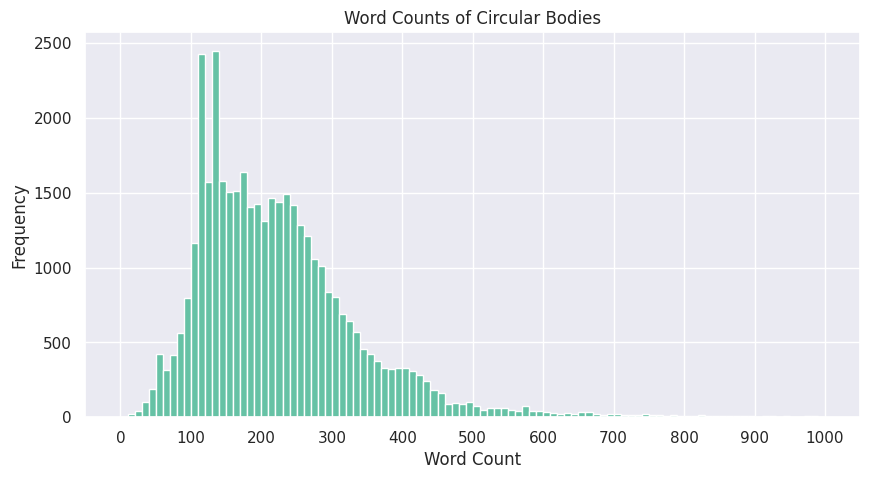

Number of circulars with > 1000 words: 315


In [10]:
'''
Get word count distribution over all circulars.
'''
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

sns.set_theme()

counts=[]
for text in circular_bodies:
  counts.append(len(text.split()))

plt.figure(figsize=(10, 5))
plt.hist(counts, range=(0,1000), bins=100, color=sns.color_palette("Set2", 1))
plt.xlabel("Word Count")
plt.ylabel("Frequency")
plt.title("Word Counts of Circular Bodies")
plt.xticks(np.arange(0, 1001, 100))
plt.show()

counts_over_1000 = [count>1000 for count in counts]
print(f'Number of circulars with > 1000 words: {sum(counts_over_1000)}')

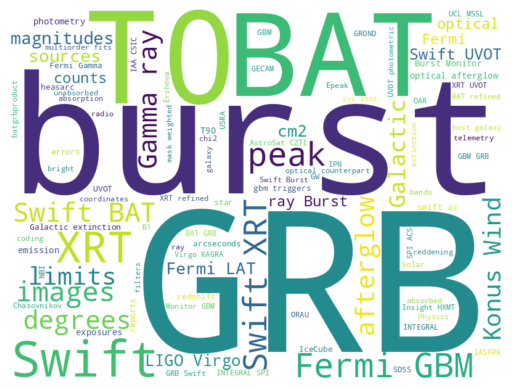

In [11]:
'''
Create word cloud over all GCN circulars.
Includes bigrams and trigrams of words.
'''
from wordcloud import WordCloud

word_cloud = WordCloud(
    collocations = True,
    background_color = 'white',
    max_words=100,
    width=800,
    height=600,
    stopwords=new_stop_words).generate(' '.join(circular_bodies))

plt.imshow(word_cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [12]:
'''
Print the list of words in the word cloud
'''

word_frequencies = word_cloud.words_
words = list(word_frequencies.keys())
for word in words:
  print(word)

GRB
burst
T0
BAT
Swift
XRT
Fermi GBM
peak
Swift XRT
images
Swift BAT
Gamma ray
afterglow
degrees
limits
Konus Wind
Galactic
magnitudes
sources
Fermi LAT
cm2
LIGO Virgo
Swift UVOT
optical
ray Burst
counts
Fermi
optical afterglow
T90
photometry
swift ac
Burst Monitor
emission
exposures
heasarc
reports
Fermi Gamma
GBM
UVOT
errors
IceCube
redshift
star
arcseconds
gbm triggers
Solar
Galactic extinction
B1
bright
unabsorbed
SPI ACS
extinction
coordinates
IASFPA
Swift Burst
optical counterpart
IAA CSIC
Physics
bands
Epeak
Monitor GBM
SDSS
USRA
ray
absorption
GW
INTEGRAL SPI
IPN
host galaxy
AstroSat CZTI
reddening
telemetry
chi2
galaxy
coding
BAT refined
absorbed
BAT GRB
GBM GRB
OAR
sys stat
UCL MSSL
radio
INTEGRAL
filters
GROND
NBI
mask weighted
GRB Swift
Virgo KAGRA
ORAU
multiorder fits
GECAM
XRT refined
Ershova
XRT UVOT
batgrbproduct
UVOT photometric
Insight HXMT
Chasovnikov


#Step 6: Embed our Circulars

In [13]:
'''
Embed our circulars using the base all-MiniLM-L6-v2 model.
'''
from sentence_transformers import SentenceTransformer

# Default model. Really fast, but only has context window of 256 tokens
model = SentenceTransformer("all-MiniLM-L6-v2")
minilm_l6_embeddings = model.encode(circular_bodies, show_progress_bar=True)
np.save('minilm_l6_embeddings.npy', minilm_l6_embeddings)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/1260 [00:00<?, ?it/s]

#Step 11: Perform Topic Modelling

In [14]:
'''
Initialize Llama cpp model and AutoTokenizer
'''
from transformers import AutoTokenizer
from google.colab import userdata
from huggingface_hub import login
from llama_cpp import Llama

# Huggingface login required to use Mistral 7B Instruct
# Make sure to save your own Huggingface login token in your Notebook's Secrets as 'HF_LOGIN_TOKEN'
login_token = userdata.get('HF_LOGIN_TOKEN')
login(token=login_token)

tokenizer = AutoTokenizer.from_pretrained("mistralai/Mistral-7B-Instruct-v0.2")
llm = Llama(model_path="mistral-7b-instruct-v0.2.Q4_K_M.gguf",
            n_gpu_layers=-1,
            n_ctx=32768)

tokenizer_config.json:   0%|          | 0.00/2.10k [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/493k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.80M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/414 [00:00<?, ?B/s]

llama_model_loader: loaded meta data with 24 key-value pairs and 291 tensors from mistral-7b-instruct-v0.2.Q4_K_M.gguf (version GGUF V3 (latest))
llama_model_loader: Dumping metadata keys/values. Note: KV overrides do not apply in this output.
llama_model_loader: - kv   0:                       general.architecture str              = llama
llama_model_loader: - kv   1:                               general.name str              = mistralai_mistral-7b-instruct-v0.2
llama_model_loader: - kv   2:                       llama.context_length u32              = 32768
llama_model_loader: - kv   3:                     llama.embedding_length u32              = 4096
llama_model_loader: - kv   4:                          llama.block_count u32              = 32
llama_model_loader: - kv   5:                  llama.feed_forward_length u32              = 14336
llama_model_loader: - kv   6:                 llama.rope.dimension_count u32              = 128
llama_model_loader: - kv   7:                 l

In [15]:
'''
We will now perform topic modelling with BERTopic.
We use the default all-MiniLM-L6-v2 and a minimum topic size of 100 which gave the best coherence score for this model.
In addition, we will use a 4-bit quantized version of the new Mistral-7B-Instruct LLM for topic label generation.
This open sorce model has been shown to have superior performance to Llama 2 13B on multiple benchmarks.
It has been fine-tuned using publicly available conversation datasets.
'''
import time
import torch
import random
from bertopic.representation import LlamaCPP
from umap import UMAP
from hdbscan import HDBSCAN
from bertopic import BERTopic

start_time = time.time()

# Set number of threads to 1 and set other os environment variables for reproducibility
os.environ['OMP_NUM_THREADS'] = '1'
os.environ['MKL_NUM_THREADS'] = '1'
os.environ['CUBLAS_WORKSPACE_CONFIG'] = ':4096:8'
torch.set_num_threads(1)

seed_value = 42  # Set the random seed
random.seed(seed_value)
np.random.seed(seed_value)
torch.manual_seed(seed_value)
torch.cuda.manual_seed_all(seed_value)
torch.use_deterministic_algorithms(True)

# Build representation model with mistral and llama cpp
# Use a custom prompt for label generation
prompt = """Q: I have a topic that contains the following representative circulars among hundreds of others:
[DOCUMENTS]

The topic is described by the following keywords: '[KEYWORDS]'.

Based on the above information, can you give a short label of the topic?
A: """

representation_model = LlamaCPP(model=llm,
                                prompt=prompt,
                                doc_length=768,
                                tokenizer=tokenizer,
                                pipeline_kwargs={"max_tokens": 128,
                                                 "stop": "Q:",
                                                 "temperature": 0.0})

embeddings = np.load("minilm_l6_embeddings.npy")

# Fix random state in UMAP for reproducibility
umap_model = UMAP(n_neighbors=15,
                  n_components=5,
                  min_dist=0.0,
                  metric='cosine',
                  low_memory=False,
                  random_state=0)

# Set number of cores to one to turn off multi-threading. This should help with reproducibility.
# Set minimum cluster size to 400. This will iteratively merge smaller clusters to form bigger ones.
# Set minimum samples to 10. This will make sure only clusters smaller than 10 are treated as outliers.
hdbscan_model = HDBSCAN(min_cluster_size=400,
                        min_samples=10,
                        metric='euclidean',
                        cluster_selection_method='eom',
                        prediction_data=True,
                        core_dist_n_jobs=1)

# Build Topic Model with BERTopic
topic_model = BERTopic(verbose=True,
                       umap_model=umap_model,
                       hdbscan_model=hdbscan_model,
                       vectorizer_model=vectorizer_model)
topics, probs = topic_model.fit_transform(circular_bodies, embeddings)

end_time = time.time()
print(end_time - start_time)

2025-05-26 08:52:03,243 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-05-26 08:53:02,427 - BERTopic - Dimensionality - Completed ✓
2025-05-26 08:53:02,429 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-05-26 08:53:03,808 - BERTopic - Cluster - Completed ✓
2025-05-26 08:53:03,824 - BERTopic - Representation - Extracting topics from clusters using representation models.
2025-05-26 08:53:11,717 - BERTopic - Representation - Completed ✓


70.16042137145996


In [16]:
# Display topics
freq = topic_model.get_topic_info()
freq.head(30)

,Topic,Count,Name,Representation,Representative_Docs
0,-1,6890,-1_grb_neutrino_icecube_burst,"[grb, neutrino, icecube, burst, events, swift,...",[GRB 221226A: Swift/BAT-GUANO detection outsid...
1,0,9015,0_optical_grb_afterglow_images,"[optical, grb, afterglow, images, photometry, ...","[GRB 021211, optical observationsN. Caldwell (..."
2,1,2836,1_bat_swift_burst_raj2000,"[bat, swift, burst, raj2000, decj2000, xrt, ar...",[Swift-BAT Trigger 501485 is noiseB.-B. Zhang ...
3,2,2359,2_calet_burst_icecube_neutrino,"[calet, burst, icecube, neutrino, wang, hete, ...",[GRB 170626B CALET Gamma-Ray Burst Monitor det...
4,3,2303,3_ligovirgo_ligo_gw_compact,"[ligovirgo, ligo, gw, compact, null, lvc, bina...",[LIGO/Virgo/KAGRA S231206ca: Identification of...
5,4,1814,4_swiftuvot_uvot_exposures_exps,"[swiftuvot, uvot, exposures, exps, reddening, ...",[GRB 140103A: Swift/UVOT Upper LimitsM. H. Sie...
6,5,1789,5_gbm_fermi_lat_degrees,"[gbm, fermi, lat, degrees, epeak, phscm2, uah,...",[GRB 201021C: Fermi GBM detectionS. Lesage (UA...
7,6,1699,6_mastersaao_masteroafa_mastertunka_masterkisl...,"[mastersaao, masteroafa, mastertunka, masterki...",[LIGO/Virgo S230525a: Global MASTER-Net observ...
8,7,1414,7_swiftxrt_xrt_cm2_s1,"[swiftxrt, xrt, cm2, s1, xray, j20000, 0310, s...",[GRB 230812B: Swift-XRT afterglow detectionA.P...
9,8,1407,8_konuswind_chi2_peak_burst,"[konuswind, chi2, peak, burst, ergcm2, grb, ul...",[Konus-Wind detection of GRB 250404A / EP25040...


In [17]:
# Error Analysis

document_info = topic_model.get_document_info(circular_bodies)
document_info.head()

,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,Possible new SGR from US Naval ObservatoryThe ...,8,8_konuswind_chi2_peak_burst,"[konuswind, chi2, peak, burst, ergcm2, grb, ul...",[Konus-Wind detection of GRB 250404A / EP25040...,konuswind - chi2 - peak - burst - ergcm2 - grb...,0.127502,False
1,RXTE Observations of SGR 1814-13Don Smith on b...,0,0_optical_grb_afterglow_images,"[optical, grb, afterglow, images, photometry, ...","[GRB 021211, optical observationsN. Caldwell (...",optical - grb - afterglow - images - photometr...,1.000000,False
2,GRB 970828: Palomar ObservationsFor the recent...,0,0_optical_grb_afterglow_images,"[optical, grb, afterglow, images, photometry, ...","[GRB 021211, optical observationsN. Caldwell (...",optical - grb - afterglow - images - photometr...,1.000000,False
3,GRB 970228: Keck/LRIS Optical ObservationsShri...,0,0_optical_grb_afterglow_images,"[optical, grb, afterglow, images, photometry, ...","[GRB 021211, optical observationsN. Caldwell (...",optical - grb - afterglow - images - photometr...,0.839384,False
4,IRAS 18119-1342 and the possible new SGRGeorge...,-1,-1_grb_neutrino_icecube_burst,"[grb, neutrino, icecube, burst, events, swift,...",[GRB 221226A: Swift/BAT-GUANO detection outsid...,grb - neutrino - icecube - burst - events - sw...,0.000000,False


In [18]:
'''
Apply t-SNE to reduce the dimensionality of the embeddings and visualize the clusters.
'''
from sklearn.manifold import TSNE
import plotly.graph_objects as go
import pandas as pd
import plotly.express as px
import itertools

# reduced_embeddings = UMAP(n_components=2, random_state=0).fit_transform(embeddings)
reduced_embeddings = TSNE(n_components=2, n_jobs=1, random_state=0, verbose=2).fit_transform(embeddings)

fig = go.Figure()
tsne_df = pd.DataFrame()
tsne_df["x"], tsne_df["y"] = reduced_embeddings[:, 0], reduced_embeddings[:, 1]
tsne_df["topics"] = [topic_model.topic_labels_[i] for i in topics]

unique_topics = list(topic_model.topic_labels_.values())[1:]
light24 = px.colors.qualitative.Light24
dark24 = px.colors.qualitative.Dark24
colors = light24[0:11] + [dark24[9]] + dark24[5:8] + dark24[15:17] + [dark24[13]] + [light24[22]] + [light24[17]]
color_cycle = itertools.cycle(colors)

for label in unique_topics:
    sub_df = tsne_df.loc[tsne_df["topics"] == label]
    fig.add_trace(
        go.Scattergl(
            x=sub_df["x"],
            y=sub_df["y"],
            mode="markers",
            name=str(label[label.find('_')+1:]) + " (" + str(sub_df.shape[0]) + ")",
            marker=dict(
                color=next(color_cycle),
                size=5,
                opacity=0.5,
            )
        )
    )

fig.update_traces(
  marker=dict(
    size=5,
    opacity=0.5,
  )
)

fig.update_layout(
  title={
    'text': "<b>General Coordinates Network (GCN): Key Astrophysical Topics</b>",
    'x': 0.5,
    'xanchor': 'center'
  },
  width=1200,
  height=800,
  legend_title_text="Topics (Circular Counts)",
  legend=dict(
    x=1.05,
    y=1,
    traceorder='normal',
    bgcolor='rgba(0,0,0,0)',
    bordercolor='rgba(0,0,0,0)'
  ),
  xaxis=dict(
    showticklabels=False
  ),
  yaxis=dict(
    showticklabels=False
  )
)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 40302 samples in 0.006s...
[t-SNE] Computed neighbors for 40302 samples in 9.936s...
[t-SNE] Computed conditional probabilities for sample 1000 / 40302
[t-SNE] Computed conditional probabilities for sample 2000 / 40302
[t-SNE] Computed conditional probabilities for sample 3000 / 40302
[t-SNE] Computed conditional probabilities for sample 4000 / 40302
[t-SNE] Computed conditional probabilities for sample 5000 / 40302
[t-SNE] Computed conditional probabilities for sample 6000 / 40302
[t-SNE] Computed conditional probabilities for sample 7000 / 40302
[t-SNE] Computed conditional probabilities for sample 8000 / 40302
[t-SNE] Computed conditional probabilities for sample 9000 / 40302
[t-SNE] Computed conditional probabilities for sample 10000 / 40302
[t-SNE] Computed conditional probabilities for sample 11000 / 40302
[t-SNE] Computed conditional probabilities for sample 12000 / 40302
[t-SNE] Computed conditional probabilities for sam

In [19]:
'''
Generate topic summaries with Mistral 7B Instruct and update representations
'''

topic_model.update_topics(circular_bodies,
                          representation_model=representation_model)

  0%|          | 0/23 [00:00<?, ?it/s]
llama_print_timings:        load time =     589.09 ms
llama_print_timings:      sample time =      16.39 ms /    31 runs   (    0.53 ms per token,  1891.74 tokens per second)
llama_print_timings: prompt eval time =    4131.57 ms /  3172 tokens (    1.30 ms per token,   767.75 tokens per second)
llama_print_timings:        eval time =    1057.02 ms /    30 runs   (   35.23 ms per token,    28.38 tokens per second)
llama_print_timings:       total time =    5231.87 ms /  3202 tokens
  4%|▍         | 1/23 [00:05<01:55,  5.25s/it]Llama.generate: prefix-match hit

llama_print_timings:        load time =     589.09 ms
llama_print_timings:      sample time =      10.61 ms /    20 runs   (    0.53 ms per token,  1885.90 tokens per second)
llama_print_timings: prompt eval time =    4176.23 ms /  3136 tokens (    1.33 ms per token,   750.92 tokens per second)
llama_print_timings:        eval time =     673.07 ms /    19 runs   (   35.42 ms per token,    28.

In [20]:
# Display topic summaries
freq = topic_model.get_topic_info()
freq.head(30)

,Topic,Count,Name,Representation,Representative_Docs
0,-1,6890,-1_ Swift/BAT Detections and Localizations of ...,[ Swift/BAT Detections and Localizations of Ga...,[GRB 221226A: Swift/BAT-GUANO detection outsid...
1,0,9015,0_ GRB Optical Afterglow Observations Reported...,[ GRB Optical Afterglow Observations Reported ...,"[GRB 021211, optical observationsN. Caldwell (..."
2,1,2836,1_ Swift Detection and Analysis of GRBs: BAT T...,[ Swift Detection and Analysis of GRBs: BAT Tr...,[Swift-BAT Trigger 501485 is noiseB.-B. Zhang ...
3,2,2359,2_ CALET Gamma-Ray Burst Detections and Data A...,[ CALET Gamma-Ray Burst Detections and Data An...,[GRB 170626B CALET Gamma-Ray Burst Monitor det...
4,3,2303,3_ LIGO/Virgo Compact Binary Merger Candidates...,[ LIGO/Virgo Compact Binary Merger Candidates:...,[LIGO/Virgo/KAGRA S231206ca: Identification of...
5,4,1814,4_ Swift/UVOT Upper Limits and Detections with...,[ Swift/UVOT Upper Limits and Detections with ...,[GRB 140103A: Swift/UVOT Upper LimitsM. H. Sie...
6,5,1789,5_ Fermi GBM Detections and Spectral Analysis ...,[ Fermi GBM Detections and Spectral Analysis R...,[GRB 201021C: Fermi GBM detectionS. Lesage (UA...
7,6,1699,6_ Global MASTER-Net Observations: Swift GRBs ...,[ Global MASTER-Net Observations: Swift GRBs a...,[LIGO/Virgo S230525a: Global MASTER-Net observ...
8,7,1414,7_ Swift-XRT team reports X-ray afterglow dete...,[ Swift-XRT team reports X-ray afterglow detec...,[GRB 230812B: Swift-XRT afterglow detectionA.P...
9,8,1407,8_ Konus-Wind Observations and Analysis of Lon...,[ Konus-Wind Observations and Analysis of Long...,[Konus-Wind detection of GRB 250404A / EP25040...


In [21]:
'''
Get table with just Topic Summaries and Frequencies
'''
sub_freq = freq[['Representation', 'Count']].copy()
sub_freq['Topic Summary'] = freq['Representation'].apply(lambda x: x[0] if isinstance(x, list) and len(x) > 0 else None)
sub_freq['Circular Count'] = freq['Count']
sub_freq.drop('Representation', axis=1, inplace=True)
sub_freq.drop('Count', axis=1, inplace=True)

In [22]:
sub_freq.drop(index=0, inplace=True) # Drop outlier row
sub_freq

,Topic Summary,Circular Count
1,GRB Optical Afterglow Observations Reported b...,9015
2,Swift Detection and Analysis of GRBs: BAT Tri...,2836
3,CALET Gamma-Ray Burst Detections and Data Ana...,2359
4,LIGO/Virgo Compact Binary Merger Candidates: ...,2303
5,Swift/UVOT Upper Limits and Detections with G...,1814
6,Fermi GBM Detections and Spectral Analysis Re...,1789
7,Global MASTER-Net Observations: Swift GRBs an...,1699
8,Swift-XRT team reports X-ray afterglow detect...,1414
9,Konus-Wind Observations and Analysis of Long-...,1407
10,Swift-XRT Team Reports Astrometrically Correc...,1201


In [23]:
latex_table = sub_freq.to_latex(index=False)
latex_table

"\\begin{tabular}{lr}\n\\toprule\nTopic Summary & Circular Count \\\\\n\\midrule\n GRB Optical Afterglow Observations Reported by Various Telescopes. & 9015 \\\\\n Swift Detection and Analysis of GRBs: BAT Trigger Data and XRT Observations. & 2836 \\\\\n CALET Gamma-Ray Burst Detections and Data Analysis by CALET Collaboration. & 2359 \\\\\n LIGO/Virgo Compact Binary Merger Candidates: Properties and Sky Localization. & 2303 \\\\\n Swift/UVOT Upper Limits and Detections with Galactic Extinction Corrections. & 1814 \\\\\n Fermi GBM Detections and Spectral Analysis Results (GRB 240204A, GRB 201021C, GRB 231215A, GRB 210802A) & 1789 \\\\\n Global MASTER-Net Observations: Swift GRBs and Upper Limits from Multiple Robotic Telescopes (MASTER-SAAO, MASTER-IAC, MASTER-Kislovodsk, MASTER-Tavrida) by V. Lipunov et al. (Lomonosov Moscow State University, SAI, Instituto de Ciencias Astronomicas, ICATE, The Instituto de Astrofisica de Canarias, South African Astronomical Observatory, Irkutsk State 

In [24]:
'''
Visualise topics in a 2-D space using UMAP
'''
topic_model.visualize_topics()

In [25]:
'''
Perform hierarchical reduction on our topic model.
Viualize these hierarchies to better understand the relations between our topics.
'''

hierarchical_topics = topic_model.hierarchical_topics(circular_bodies)
topic_model.visualize_hierarchy(hierarchical_topics=hierarchical_topics)

  0%|          | 0/1 [00:00<?, ?it/s]Llama.generate: prefix-match hit

llama_print_timings:        load time =     589.09 ms
llama_print_timings:      sample time =      13.16 ms /    25 runs   (    0.53 ms per token,  1899.70 tokens per second)
llama_print_timings: prompt eval time =    4020.66 ms /  3082 tokens (    1.30 ms per token,   766.54 tokens per second)
llama_print_timings:        eval time =     828.45 ms /    24 runs   (   34.52 ms per token,    28.97 tokens per second)
llama_print_timings:       total time =    4884.93 ms /  3106 tokens

  0%|          | 0/1 [00:00<?, ?it/s]Llama.generate: prefix-match hit

llama_print_timings:        load time =     589.09 ms
llama_print_timings:      sample time =      23.24 ms /    41 runs   (    0.57 ms per token,  1763.97 tokens per second)
llama_print_timings: prompt eval time =    3731.68 ms /  2937 tokens (    1.27 ms per token,   787.05 tokens per second)
llama_print_timings:        eval time =    1382.70 ms /    40 runs   (   34

In [26]:
'''
Visualize hierarchical topic clusters
'''
topic_model.visualize_hierarchical_documents(circular_bodies, hierarchical_topics, embeddings=embeddings, topics=list(range(20)))

In [27]:
'''
Display a Similarity Matrix for all Topics
'''
topic_model.visualize_heatmap(topics=list(range(20)), width=650, height=650)

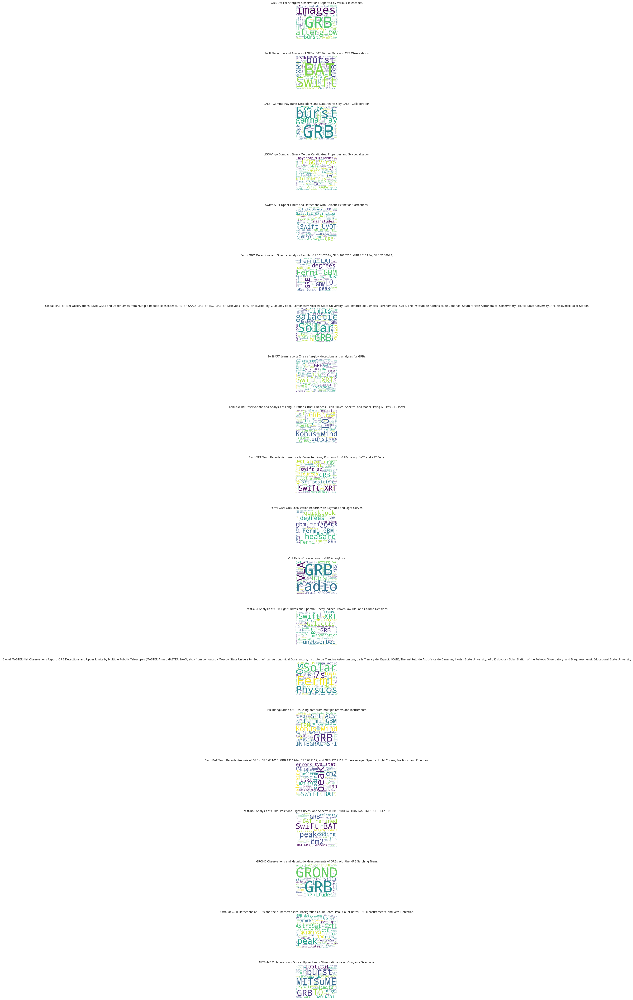

In [28]:
'''
Create word cloud over top 10 topics
'''

fig, axs = plt.subplots(20, 1, figsize=(10, 80)) # Create a figure with 10 subplots vertically arranged

# Join all documents of a topic together and generate word cloud
for topic_num, ax in enumerate(axs):
    word_cloud = WordCloud(
        collocations=True,
        background_color='white',
        max_words=100,
        width=1000,
        height=800,
        stopwords=new_stop_words).generate(' '.join([text for i, text in enumerate(circular_bodies) if topics[i] == topic_num]))

    ax.imshow(word_cloud, interpolation='bilinear')
    ax.set_title(topic_model.topic_representations_[topic_num][0][0])
    ax.axis("off")

plt.subplots_adjust(hspace=0.5)
plt.show()

#Step 12: Trend Analysis

In [29]:
print(topics[0])

8


In [32]:
# Error Analysis
from datetime import datetime

cutoff_date = datetime(2019, 1, 1)
errors = []
for i, time_stamp in enumerate(time_stamps):
  time = datetime.utcfromtimestamp(time_stamp / 1000)
  if topics[i] == 2 and time < cutoff_date:
    errors.append(circulars[i]["subject"])

with open("errors.txt", "w") as f:
  for error in errors:
    f.write(error + "\n")

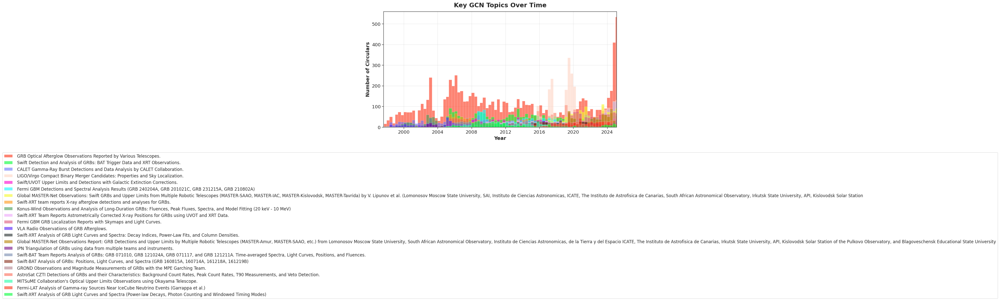

In [34]:
'''
We will now perform Trend Analysis over the topic clusters.
'''
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import itertools
num_topics = len(freq) - 1  # Subtract 1 to exclude outlier row

sns.set_style("whitegrid")
sns.set_style("ticks")
sns.set_context("paper", font_scale=1.5)

light24 = px.colors.qualitative.Light24
dark24 = px.colors.qualitative.Dark24
colors = light24[0:11] + [dark24[9]] + dark24[5:8] + dark24[15:17] + [dark24[13]] + [light24[22]] + [light24[17]]
color_cycle = itertools.cycle(colors)

fig, ax = plt.subplots(figsize=(12, 6))

for k in range(num_topics):
    topic_dates = []  # List to store dates for topic k
    all_dates = []  # List to store all dates

    # Iterate over all timestamps and check their respective document's topic
    # If topic matches k, append its timestamp (as DateTime object) to topic_dates
    for i, time_stamp in enumerate(time_stamps):
        if time_stamp == 0:  # Discard invalid dates
            continue
        if topics[i] == k:
            topic_dates.append(datetime.utcfromtimestamp(time_stamp / 1000))  # Append datetime object to topic_dates
        all_dates.append(datetime.utcfromtimestamp(time_stamp / 1000))

    my_bins = pd.date_range(start=min(all_dates), end=max(all_dates), freq='4M')

    # Iterate through each topic in our topic_dates dict and create histogram
    sns.histplot(topic_dates,
                 bins=mdates.date2num(my_bins),
                 alpha=0.6,
                 linewidth=0.2,
                 color=next(color_cycle),
                 ax=ax,
                 label=topic_model.topic_representations_[k][0][0].replace('\n', ''))

# Calculate the number of 6-month intervals between start and end dates
start_date = min(all_dates)
end_date = max(all_dates)
num_intervals = (end_date.year - start_date.year) * 2 + (end_date.month - start_date.month) // 6

# Calculate the adjusted end date based on the number of intervals
adjusted_end_date = start_date + pd.DateOffset(months=num_intervals * 6)

plt.xlim(start_date, adjusted_end_date)
plt.gca().xaxis.set_major_locator(mdates.YearLocator(4))
plt.xlabel("Year", fontsize=14, fontweight="bold")
plt.ylabel("Number of Circulars", fontsize=14, fontweight="bold")
plt.title("Key GCN Topics Over Time", fontsize=18, fontweight="bold", y=1.02)
plt.grid(axis="both", linestyle="-", alpha=0.5)
plt.legend(bbox_to_anchor=(0.5, -0.2), loc='upper center', fontsize=12)

plt.tight_layout()
plt.show()

# fig, axes = plt.subplots(num_topics, 1, figsize=(18, 6 * num_topics), sharex=True)

# for k in range(num_topics):
#     ax = axes[k]
#     topic_dates = []  # List to store dates for topic k
#     all_dates = []  # List to store all dates

#     # Iterate over all timestamps and check their respective document's topic
#     # If topic matches k, append its timestamp (as DateTime object) to topic_dates
#     for i, time_stamp in enumerate(time_stamps):
#         if time_stamp == 0:  # Discard invalid dates
#             continue
#         if topics[i] == k:
#             topic_dates.append(datetime.utcfromtimestamp(time_stamp / 1000))  # Append datetime object to topic_dates
#         all_dates.append(datetime.utcfromtimestamp(time_stamp / 1000))

#     my_bins = pd.date_range(start=min(all_dates), end=max(all_dates), freq='6M')

#     # Create histogram for the topic
#     sns.histplot(topic_dates,
#                  bins=mdates.date2num(my_bins),
#                  alpha=1.0,
#                  linewidth=0.2,
#                  color=next(color_cycle),
#                  ax=ax)

#     # Calculate the number of 6-month intervals between start and end dates
#     start_date = min(all_dates)
#     end_date = max(all_dates)
#     num_intervals = (end_date.year - start_date.year) * 2 + (end_date.month - start_date.month) // 6

#     # Calculate the adjusted end date based on the number of intervals
#     adjusted_end_date = start_date + pd.DateOffset(months=num_intervals * 6)

#     ax.set_xlim(start_date, adjusted_end_date)
#     ax.xaxis.set_major_locator(mdates.YearLocator(2))
#     ax.set_xlabel("Year", fontsize=14, fontweight="bold")
#     ax.set_ylabel("Number of Circulars", fontsize=14, fontweight="bold")
#     ax.set_title(topic_model.topic_representations_[k][0][0], fontsize=18, fontweight="bold", y=1.02)
#     ax.grid(axis="both", linestyle="-")

# plt.tight_layout()
# plt.show()

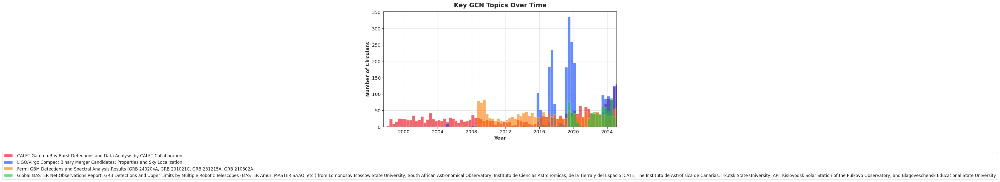

In [35]:
'''
Get histogram for some key topics
'''

num_topics = len(freq) - 1  # Subtract 1 to exclude outlier row
important_topics_list = [2, 3, 5, 13]

sns.set_style("whitegrid")
sns.set_style("ticks")
sns.set_context("paper", font_scale=1.5)
custom_colors = ['#e8000b', '#023eff', '#ff7c00', '#1ac938', '#8b2be2']
custom_palette =  sns.color_palette(custom_colors)

fig, ax = plt.subplots(figsize=(12, 6))

for j, k in enumerate(important_topics_list):
    topic_dates = []  # List to store dates for topic k
    all_dates = []  # List to store all dates

    # Iterate over all timestamps and check their respective document's topic
    # If topic matches k, append its timestamp (as DateTime object) to topic_dates
    for i, time_stamp in enumerate(time_stamps):
        if time_stamp == 0:  # Discard invalid dates
            continue
        if topics[i] == k:
            topic_dates.append(datetime.utcfromtimestamp(time_stamp / 1000))  # Append datetime object to topic_dates
        all_dates.append(datetime.utcfromtimestamp(time_stamp / 1000))

    my_bins = pd.date_range(start=min(all_dates), end=max(all_dates), freq='4M')

    # Iterate through each topic in our topic_dates dict and create histogram
    sns.histplot(topic_dates,
                 bins=mdates.date2num(my_bins),
                 alpha=0.6,
                 linewidth=0.2,
                 color=custom_palette[j],
                 ax=ax,
                 label=topic_model.topic_representations_[k][0][0])

# Calculate the number of 6-month intervals between start and end dates
start_date = min(all_dates)
end_date = max(all_dates)
num_intervals = (end_date.year - start_date.year) * 2 + (end_date.month - start_date.month) // 6

# Calculate the adjusted end date based on the number of intervals
adjusted_end_date = start_date + pd.DateOffset(months=num_intervals * 6)

plt.xlim(start_date, adjusted_end_date)
plt.gca().xaxis.set_major_locator(mdates.YearLocator(4))
plt.xlabel("Year", fontsize=14, fontweight="bold")
plt.ylabel("Number of Circulars", fontsize=14, fontweight="bold")
plt.title("Key GCN Topics Over Time", fontsize=18, fontweight="bold", y=1.02)
plt.grid(axis="both", linestyle="-", alpha=0.5)
plt.legend(bbox_to_anchor=(0.5, -0.2), loc='upper center', fontsize=12)
# plt.legend(loc='upper left', bbox_to_anchor=(0.05, 0.95), frameon=True)

plt.tight_layout()
plt.show()